Things to add to report
- Hypothesis that there should be 3 groups - light-med, heavy, and synthetic

In [15]:
import pandas as pd
import numpy as np
from IPython.display import display,  Image
from datetime import datetime
import requests
import os
import joblib

from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.cluster import MiniBatchKMeans, AgglomerativeClustering
from sklearn.metrics.cluster import contingency_matrix
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LogisticRegressionCV
from sklearn.svm import SVC
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.metrics import (
    silhouette_score,
    davies_bouldin_score,
    calinski_harabasz_score, 
    adjusted_rand_score,
    normalized_mutual_info_score,
    fowlkes_mallows_score,
    silhouette_samples,
    # classification_report,
    confusion_matrix
)
from scipy.optimize import linear_sum_assignment

import altair as alt
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from IPython.display import Image

pd.set_option('future.no_silent_downcasting', True)
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

# Data Source

### Crude Dict

In [16]:
crude_oils_dict = {
    'MSW Feeder':{'min_date':'1999-11-12','grades':{'Federated':'FD','Light Smiley':'MSY','Peace':'MPR','Pembina':'P','Secure Sask Light':'MSE',}},
    'Light Sweet':{'min_date':'1999-11-25','grades':{'Mixed Sweet Blend':'MSW','Rainbow':'RA',}},
    'Medium Sour':{'min_date':'1900-01-00','grades':{'Medium Gibson Sour':'MGS','Midale':'MSM','Peace Pipe Sour':'SPR',}},
    'Pooled Crudes - ex Superior':{'min_date':'1900-01-00','grades':{'Conventional Heavy':'CHV','Hardisty Synthetic Crude':'HSC','Light Sour Blend':'LSB','Medium Sour Blend':'MSB','Mixed Sweet Blend':'Superior','Premium Conventional Heavy':'PCH','Premium Synthetic':'PSY','Synbit Blend':'SYB','Synthetic Sweet Blend':'SYN',}},
    'Light Sour':{'min_date':'1900-01-00','grades':{'BC Light':'BCL','Boundary Lake':'BDY','Koch Alberta':'CAL','Moose Jaw Tops':'MJT','Pembina Light Sour':'PLS',}},
    'Sweet Synthetic':{'min_date':'1900-01-00','grades':{'CNRL Light Sweet Synthetic':'CNS','Husky Synthetic Blend':'HSB','Long Lake Light Synthetic':'PSC','Premium Albian Synthetic':'PAS','Shell Synthetic Light':'SSX','Suncor Synthetic A':'OSA','Syncrude Sweet Premium':'SSP',}},
    'Heavy Sour - Conventional':{'min_date':'1900-01-00','grades':{'Bow River North':'BRN','Bow River South':'BRS','Clearwater Heavy':'CWH','Fosterton':'F','Lloyd Blend':'LLB','Lloyd Kerrobert':'LLK','Seal Heavy':'SH','Smiley-Coleville':'SC','Wabasca Heavy':'WH','Western Canadian Blend':'WCB',}},
    'Heavy Sour - Unconventional':{'min_date':'1900-01-00','grades':{'Access Western Blend':'AWB','Borealis Heavy Blend':'BHB','Canadian Natural High TAN':'CNX','Christina Dilbit Blend':'CDB','Cold Lake':'CL','Fort Hills Dilbit':'FRB','Kearl Lake':'KDB','Leismer Corner Blend':'LCB','Long Lake Heavy Dilbit':'PDH','Surmont Heavy Dilbit':'SHD','Western Canada Dilbit':'WDB','Western Canadian Select':'WCS',}},
    'Heavy Sour - Synbit':{'min_date':'1900-01-00','grades':{'Long Lake Heavy':'PSH','PetroChina Blend':'PXB','Statoil Cheecham Synbit':'SCS','Surmont Heavy Blend':'SHB','Surmont Mix A':'SMA',}},
    'Heavy Sour - Partially Upgraded':{'min_date':'1900-01-00','grades':{'Albian Heavy Synthetic':'AHS',}},
    'Heavy Low Resid':{'min_date':'1900-01-00','grades':{'Suncor Synthetic H':'OSH',}},

}

### Data Import Function

In [ ]:
# Function to create a dataframe from historical crude oil properties by crude_grade
def get_data(crude_grade, crude_oils_dict):
    # Create URL parts
    start_date = crude_oils_dict[crude_grade]['min_date'] # Start date is the min_date defined in the crude_oils_dict for each crude_grade
    end_date = datetime.now().date().strftime('%Y-%m-%d') # End date is the current date
    base_url = 'https://www.crudemonitor.ca/api/1.1/json.php?'
    crude_properties_url = '&crudeProperties%5B0%5D=crudes-BA&crudeProperties%5B1%5D=crudes-LE&crudeProperties%5B2%5D=crudes-HTSD'
    crudes_url = ''.join([f'&crudes%5B{i}%5D={x.replace(' ','+')}' for i, x in enumerate([k for k in crude_oils_dict[crude_grade]['grades'].keys()])])
    date_url = f'&date%5Bstart%5D={start_date}&date%5Bend%5D={end_date}'

    # Merge url parts into full url
    url = base_url + crudes_url + crude_properties_url + date_url

    # Request data from API
    response = requests.get(url)
    response.raise_for_status()

    # Create dataframe
    response_df = pd.DataFrame.from_dict(response.json())

    # Replace values
    response_df = response_df.replace({'': np.nan, 'ND': np.nan}).infer_objects(copy=False)

    # Correct Location names
    response_df['Location'] = response_df['Location'].str.replace(r'(?i)milk.+river', 'Milk River', regex=True)
    
    # Change numeric columns datatypes
    num_cols = response_df.columns[4:]
    response_df[num_cols] = response_df[num_cols].apply(pd.to_numeric, errors='coerce')

    # Downcast numeric columns where possible
    for col in response_df.select_dtypes(include=['float64']).columns:
        response_df[col] = pd.to_numeric(response_df[col], downcast='float') 
    for col in response_df.select_dtypes(include=['int64']).columns:
        response_df[col] = pd.to_numeric(response_df[col], downcast='integer')

    # Convert Sample Date (yyyy-mm-dd) column to datetime
    response_df['Sample Date (yyyy-mm-dd)'] = pd.to_datetime(response_df['Sample Date (yyyy-mm-dd)'])

    # Add target labels to df
    response_df = response_df.assign(target_label=crude_grade)

    # Fix Location
    response_df.loc[response_df['Crude']=='Pembina Light Sour','Location'] = 'Edmonton'

    return response_df

# Load df from file
if os.path.exists('df.csv'):
    df = joblib.load('df.csv')
else:
    df = pd.concat(
        [get_data(crude_grade, crude_oils_dict) for crude_grade in crude_oils_dict.keys()],
        ignore_index=True,
        copy=False
    )
    # joblib.dump(df, 'df.csv')

# Display the dataset
df

,Crude,Batch,Sample Date (yyyy-mm-dd),Location,Density (kg/m³) [ASTM D5002],Gravity (°API) [ASTM D5002],Sulphur (wt%) [ASTM D4294],Micro Carbon Residue (wt%) [ASTM D4530],Sediment (ppmw) [ASTM D4807],Total Acid Number (mgKOH/g) [ASTM D664],...,91 Mass% Recovered (°C) [ASTM D7169],92 Mass% Recovered (°C) [ASTM D7169],93 Mass% Recovered (°C) [ASTM D7169],94 Mass% Recovered (°C) [ASTM D7169],95 Mass% Recovered (°C) [ASTM D7169],96 Mass% Recovered (°C) [ASTM D7169],97 Mass% Recovered (°C) [ASTM D7169],98 Mass% Recovered (°C) [ASTM D7169],99 Mass% Recovered (°C) [ASTM D7169],target_label
0,Federated,FD-263,2001-11-21,Edmonton,825.400024,39.799999,0.36,1.30,NaN,NaN,...,605.099976,629.900024,670.900024,NaN,NaN,NaN,NaN,NaN,NaN,MSW Feeder
1,Federated,FD-227,2001-12-11,Edmonton,826.599976,39.500000,0.34,1.10,NaN,NaN,...,551.200012,564.799988,577.700012,590.500000,606.400024,630.000000,684.000000,NaN,NaN,MSW Feeder
2,Federated,FD-302,2002-01-22,Edmonton,828.900024,39.099998,0.36,1.40,NaN,NaN,...,563.000000,573.299988,584.799988,597.000000,610.099976,625.900024,645.200012,670.200012,710.099976,MSW Feeder
3,Federated,Jul 99 - Nov 99,1999-11-12,Enbridge,825.700012,39.700001,0.31,1.51,NaN,NaN,...,537.000000,552.000000,550.000000,563.000000,579.000000,599.000000,626.000000,643.000000,650.000000,MSW Feeder
4,Federated,Nov 99 - Jan 00,2000-01-16,Enbridge,827.299988,39.299999,0.34,1.49,NaN,NaN,...,591.000000,600.000000,562.000000,579.000000,565.000000,579.000000,595.000000,615.000000,639.000000,MSW Feeder
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8556,Suncor Synthetic H,OSH-1041,2025-05-02,Hardisty,938.099976,19.200001,3.24,0.70,NaN,3.51,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Heavy Low Resid
8557,Suncor Synthetic H,OSH-1098,2025-06-04,Hardisty,938.500000,19.100000,3.20,0.50,20.0,3.68,...,493.500000,498.500000,504.100006,510.899994,519.400024,533.200012,552.599976,581.299988,624.900024,Heavy Low Resid
8558,Suncor Synthetic H,OSH-1086,2025-07-05,Hardisty,937.700012,19.299999,3.27,1.30,NaN,3.63,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Heavy Low Resid
8559,Suncor Synthetic H,OSH-1560,2025-08-01,Hardisty,937.400024,19.299999,3.18,0.70,NaN,3.40,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Heavy Low Resid


# Data Summary  
### Dataframe Shape & Datatypes

In [279]:
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8561 entries, 0 to 8560
Data columns (total 133 columns):
 #    Column                                   Dtype         
---   ------                                   -----         
 0    Crude                                    object        
 1    Batch                                    object        
 2    Sample Date (yyyy-mm-dd)                 datetime64[ns]
 3    Location                                 object        
 4    Density (kg/m³) [ASTM D5002]             float32       
 5    Gravity (°API) [ASTM D5002]              float32       
 6    Sulphur (wt%) [ASTM D4294]               float32       
 7    Micro Carbon Residue (wt%) [ASTM D4530]  float32       
 8    Sediment (ppmw) [ASTM D4807]             float32       
 9    Total Acid Number (mgKOH/g) [ASTM D664]  float32       
 10   Salt (ptb) [ASTM D3230]                  float32       
 11   Nickel (mg/kg) [ASTM D5708A]             float32       
 12   Vanadium (mg/kg) [

### Feature Descriptions

| Feature | Description |
|----------|--------------|
| **Crude** | Name of the crude oil grade. |
| **Batch** | Shipment or lot identifier for the sample. |
| **Sample Date (yyyy-mm-dd)** | Date the crude sample was collected. |
| **Location** | Site or facility where the sample was taken. |
| **Density (kg/m³) [ASTM D5002]** | Mass per unit volume; indicates heaviness of crude. |
| **Gravity (°API) [ASTM D5002]** | Measure of crude lightness; inverse of density. |
| **Sulphur (wt%) [ASTM D4294]** | Sulphur content; affects refining and emissions. |
| **Micro Carbon Residue (wt%) [ASTM D4530]** | Carbon left after pyrolysis; indicator of coke-forming tendency. |
| **Sediment (ppmw) [ASTM D4807]** | Solid impurities or particles in crude. |
| **Total Acid Number (mgKOH/g) [ASTM D664]** | Measure of acidity; indicates corrosive potential. |
| **Salt (ptb) [ASTM D3230]** | Salt concentration; impacts corrosion and desalting needs. |
| **Nickel (mg/kg) [ASTM D5708A]** | Metal contaminant affecting catalyst life. |
| **Vanadium (mg/kg) [ASTM D5708A]** | Metal impurity impacting refining catalysts. |
| **C1–C10 Components (vol%) [GC/FID]** | Light hydrocarbon composition (methane to decane) by gas chromatography; indicates volatility and gas content. |
| **iC4–nC5 (vol%) [GC/FID]** | Branched and normal butane/pentane fractions; measure of light-end structure. |
| **C6–C10 (vol%) [GC/FID]** | Heavier paraffins; affect vapor pressure and yield profiles. |
| **Nitrogen – C4- (vol%) [GPA 2177M]** | Nitrogen content in light gas fraction. |
| **Carbon Dioxide – C4- (vol%) [GPA 2177M]** | CO₂ concentration in gas fraction. |
| **C1–nC4 – C4- (vol%) [GPA 2177M]** | Light hydrocarbon breakdown (methane through butane) in gas stream. |
| **IBP (°C) [ASTM D7169]** | Initial boiling point; start of vaporization during distillation. |
| **1–99 Mass% Recovered (°C) [ASTM D7169]** | Distillation temperatures where 1–99% of sample mass is vaporized; describes boiling range and fractionation behavior. |
| **target_label** | CrudeMonitor crude group name |

# EDA  
### Column Groups

In [29]:
# Categorical columns
categorical_cols = ['Crude', 'Batch', 'Sample Date (yyyy-mm-dd)', 'Location', 'target_label']

# Columns that describe the quality of the crude oil
crude_quality_cols = df.loc[:,'Density (kg/m³) [ASTM D5002]':'IBP (°C) [ASTM D7169]'].columns.to_list()

# Columns that describe distillation temperatures for the crude oil
dist_temp_cols = df.loc[:,'1 Mass% Recovered (°C) [ASTM D7169]':'99 Mass% Recovered (°C) [ASTM D7169]'].columns.to_list()

### Categorical Frequency Charts

In [281]:
alt.Chart(df[categorical_cols], title=alt.Title('Frequency of Crude Grade Categories', fontSize=15, anchor='start')).mark_bar().encode(
    alt.Y('target_label:N').sort('-x').title(None),
    alt.X('count():Q').title(None)
).properties(height=300, width=300)

alt.Chart(...)

In [280]:
alt.Chart(df[categorical_cols], title=alt.Title('Frequency of Location Categories', fontSize=15, anchor='start')).mark_bar().encode(
    alt.Y('Location:N').sort('-x').title(None),
    alt.X('count():Q').title(None)
).properties(height=300, width=400)

alt.Chart(...)

### Missing Values

In [ ]:
df_na = pd.DataFrame({'Values Missing':df.isna().sum()}).reset_index()

alt.Chart(df_na, title=alt.Title('Counts of Missing Values', fontSize=15, anchor='start')).mark_bar().encode(
    alt.Y('Values Missing:N').title('Binned Count of Missing Values').bin(True),
    alt.X('count()').title('Count of Columns'),
).properties(height=300, width=400)

alt.Chart(...)

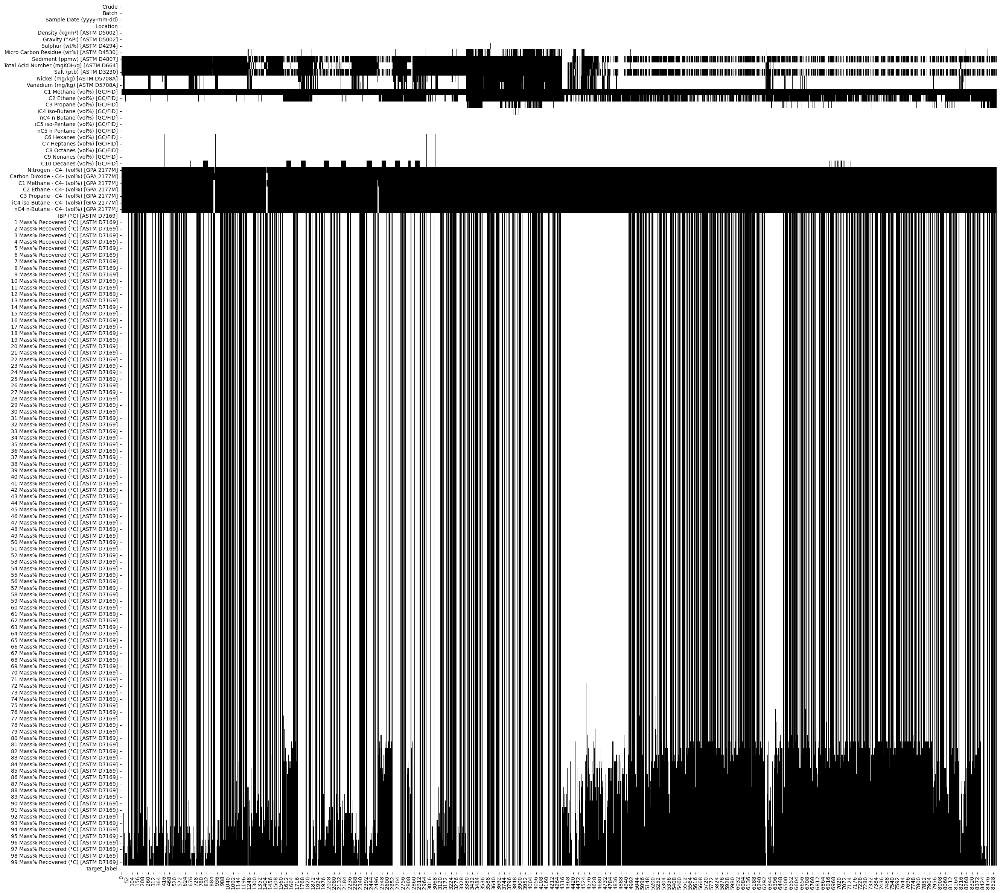

In [273]:
# Create heatmap to visualize where data is missing in the dataset
fig, ax = plt.subplots(1,1, figsize=(30,30), sharey=True) 
# plt.suptitle('Rows with Missing Values', y=0.9, fontsize = 25)
sns.heatmap(df.T.isna(), cmap=sns.color_palette('blend:#ffffff,black'), cbar=False, ax=ax)

plt.show()

### Numeric Histograms

In [261]:
# Function to plot a set of histograms for a subset of columns
def plot_column_histograms(input_df, subset, chart_title, col_count, row_sample_size):
    # Melt the numeric columns into one column
    df_melt = input_df[subset + ['target_label']].melt(id_vars='target_label', var_name='feature', value_name='value').sample(n=row_sample_size)

    # Create a base Altair histogram chart
    chart = alt.Chart(df_melt).mark_bar(opacity=0.6, binSpacing=0).encode(
        x = alt.X('value:Q').axis(title='').bin(maxbins=50),
        y = alt.Y('count():Q').axis(title='').stack(None),
        color = alt.Color('target_label:N').scale(scheme='viridis').title('Crude Grade').legend(orient='left', direction='vertical')
    ).properties(
        width=750 / col_count,
        height=150
    )

    # Display a histogram for each numeric_columns
    chart = alt.ConcatChart(
        title=alt.Title(f'{chart_title}', fontSize=20),
        concat=[chart.transform_filter(alt.datum.feature == value).properties(title=value) for value in subset],
        columns=col_count,
        # spacing=1
    ).configure_title(
        fontSize=10
    ).resolve_axis(
        x='independent',
        y='independent'
    ).resolve_scale(
        x='independent', 
        y='independent'
    )

    return chart

plot_column_histograms(df, crude_quality_cols, 'Crude Quality Columns Data Distributions', 5, 100000)

alt.ConcatChart(...)

99

In [298]:
[*range(5,len(dist_temp_cols), 5)]

[5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95]

Data Source
- Func to pull data by group
- Replace "" with np.nan
- Add target label column
- Func to store df

Data Summary
- Shape
- Datatypes
- Feature/column descriptions
 
EDA
- Create column groups
- Missing values bar chart
- Categorical cols (incl. target) frequency bar charts
- Numeric (temp replace non-numeric values and standardize):
  - Histograms (colored by target labels)
  - Box plots to identify outliers
  - Correlation heatmap

Data Cleaning
- Split into X and y
  - y = TargetEncoder target labels
- Create Pre-processing ColumnTransformer pipeline
  - Custom FunctionTransformers
    - Drop columns that aren't needed or contain large amounts of missing values 
    - *Identify where we need to replace numeric outliers and fix categorical values
    - Convert to numeric, categorical, or datetime datatypes (downcast numeric)
    - Add datetime columns (months, year)
    - Rename wrong categorical values
    - Windsorize or replace numeric outliers
  - KNNImputer numeric
  - SimpleImputer categorical 
  - StandardScaler numeric
  - OneHotEncoder categorical
- Apply preprocessing pipeline to dataframe

Modeling
- K-means
- Agglomerative
- GMM

Evaluation
- Scoring metrics
  - Internal
    - Silhouette scores
    - DBI
    - CHI
  - External
    - ARI
    - NMI
    - FMI
- Plots
  - Silhouette scores
  - PCA 2D scatter plot
  - t-SNE 2D scatter plot
  - Classification confusion matrices
- Compare to Supervised Classifiers
  - Multinomial Logistic
  - SVC
  - Gradient Boosting
  - Classification confusion matrices